### EDA ###

- For Frame of Reference:
| Year   |      Start of DST      |  End of DST |
|----------|:-------------:|------:|
| 2016 | March 13 | November 6 |
| 2017 | March 12 | November 5 |
| 2018 | March 11 | November 4 |
| 2019 | March 10 | November 3 |
| 2020 | March 8 | November 2 |

source: https://en.wikipedia.org/wiki/Main_Page

**Imports**

In [1]:
import pandas as pd
pd.set_option("display.max_columns", None)

import numpy as np
import seaborn as sns
sns.set(style = "darkgrid")

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import datetime as dt

### Reading In Data ###

**Chicago**

In [2]:
#original data:
chi_df_og = pd.read_csv('../data/chi_accidents.csv')

In [3]:
chi_df_og.head(3)

,id,severity,start_time,end_time,start_lat,start_lng,end_lat,end_lng,distance(mi),description,number,street,side,city,county,state,zipcode,country,timezone,airport_code,weather_timestamp,temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_direction,wind_speed(mph),precipitation(in),weather_condition,amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,sunrise_sunset,civil_twilight,nautical_twilight,astronomical_twilight
0,A-2749141,2,2016-11-30 14:46:48,2016-11-30 20:46:48,42.305960,-87.960150,42.306916,-87.960918,0.077,Between IL-137/Buckley Rd/Peterson Rd and IL-1...,NaN,N Milwaukee Ave,R,Libertyville,Lake,IL,60048,US,US/Central,KUGN,2016-11-30 14:55:00,37.0,31.0,79.0,29.59,10.0,West,8.1,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day
1,A-2749152,2,2016-11-30 14:58:59,2016-11-30 20:58:59,42.175870,-88.135770,42.174620,-88.135794,0.086,At US-14/Northwest Hwy - Accident.,21500.0,N IL Route 59,L,Barrington,Lake,IL,60010-2457,US,US/Central,KPWK,2016-11-30 14:52:00,37.0,28.1,76.0,29.62,10.0,West,15.0,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day
2,A-2749158,3,2016-11-30 15:14:24,2016-11-30 21:29:48,42.175897,-88.135769,42.174612,-88.135794,0.089,Between IL-22 and US-14/Northwest Hwy - Accident.,21501.0,N IL Route 59,R,Barrington,Lake,IL,60010-2456,US,US/Central,KPWK,2016-11-30 14:52:00,37.0,28.1,76.0,29.62,10.0,West,15.0,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day


In [4]:
chi_df_og.shape

(42472, 47)

In [5]:
chi_df_og.columns

Index(['id', 'severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'description', 'number', 'street',
       'side', 'city', 'county', 'state', 'zipcode', 'country', 'timezone',
       'airport_code', 'weather_timestamp', 'temperature(f)', 'wind_chill(f)',
       'humidity(%)', 'pressure(in)', 'visibility(mi)', 'wind_direction',
       'wind_speed(mph)', 'precipitation(in)', 'weather_condition', 'amenity',
       'bump', 'crossing', 'give_way', 'junction', 'no_exit', 'railway',
       'roundabout', 'station', 'stop', 'traffic_calming', 'traffic_signal',
       'turning_loop', 'sunrise_sunset', 'civil_twilight', 'nautical_twilight',
       'astronomical_twilight'],
      dtype='object')

In [6]:
#cleaned data:
chi_df = pd.read_csv('../data/chi_df_cleaned.csv')

In [7]:
chi_df.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2,42.305960,-87.960150,42.306916,-87.960918,0.077,37.0,31.0,79.0,29.59,10.0,8.1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480517e+09,1.480539e+09,1.480518e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2,42.175870,-88.135770,42.174620,-88.135794,0.086,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480518e+09,1.480540e+09,1.480518e+09,21600.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,3,42.175897,-88.135769,42.174612,-88.135794,0.089,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480519e+09,1.480541e+09,1.480518e+09,22524.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [8]:
chi_df.shape

(40974, 146)

In [9]:
chi_df.columns[:35]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'year', 'month',
       'week', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep',
       'accident_duration', 'side_L', 'side_R'],
      dtype='object')

**Boston**

In [10]:
#original data:
bos_df_og = pd.read_csv('../data/bos_accidents.csv')

In [11]:
bos_df_og.head(3)

,id,severity,start_time,end_time,start_lat,start_lng,end_lat,end_lng,distance(mi),description,number,street,side,city,county,state,zipcode,country,timezone,airport_code,weather_timestamp,temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_direction,wind_speed(mph),precipitation(in),weather_condition,amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,sunrise_sunset,civil_twilight,nautical_twilight,astronomical_twilight
0,A-2749150,2,2016-11-30 15:58:59,2016-11-30 21:58:59,41.879630,-71.377990,41.885180,-71.378500,0.384,At US-1/Broadway/Exit 29 - Accident.,NaN,I-95 N,R,Pawtucket,Providence,RI,02860,US,US/Eastern,KSFZ,2016-11-30 15:56:00,46.9,NaN,97.0,30.01,10.0,ENE,9.2,0.02,Light Rain,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day
1,A-2749199,2,2016-11-30 17:51:24,2016-11-30 23:51:24,42.619594,-71.125395,42.610934,-71.123411,0.607,At Gould Rd - Accident.,422.0,S Main St,L,Andover,Essex,MA,01810-6135,US,US/Eastern,KLWM,2016-11-30 17:54:00,45.0,40.6,97.0,29.98,7.0,East,8.1,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Day
2,A-2749201,2,2016-11-30 17:51:24,2016-11-30 23:51:24,42.610934,-71.123411,42.619594,-71.125395,0.607,At Rattlesnake Hill Rd - Accident.,12.0,Gould Rd,L,Andover,Essex,MA,01810-6215,US,US/Eastern,KLWM,2016-11-30 17:54:00,45.0,40.6,97.0,29.98,7.0,East,8.1,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Day


In [12]:
bos_df_og.shape

(13283, 47)

In [13]:
bos_df_og.columns

Index(['id', 'severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'description', 'number', 'street',
       'side', 'city', 'county', 'state', 'zipcode', 'country', 'timezone',
       'airport_code', 'weather_timestamp', 'temperature(f)', 'wind_chill(f)',
       'humidity(%)', 'pressure(in)', 'visibility(mi)', 'wind_direction',
       'wind_speed(mph)', 'precipitation(in)', 'weather_condition', 'amenity',
       'bump', 'crossing', 'give_way', 'junction', 'no_exit', 'railway',
       'roundabout', 'station', 'stop', 'traffic_calming', 'traffic_signal',
       'turning_loop', 'sunrise_sunset', 'civil_twilight', 'nautical_twilight',
       'astronomical_twilight'],
      dtype='object')

In [14]:
#cleaned data:
bos_df = pd.read_csv('../data/bos_df_cleaned.csv')

In [15]:
bos_df.head()

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Fog / Windy,weather_condition_Haze,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain Shower,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet,weather_condition_Light Thunderstorms and Rain,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Shallow Fog,weather_condition_Showers in the Vicinity,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Snow and Sleet,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2,41.879630,-71.377990,41.885180,-71.378500,0.384,46.9,46.9,97.0,30.01,10.0,9.2,0.02,0,0,0,0,1,0,0,0,0,0,0,0,0,2016,11,48,1.480522e+09,1.480543e+09,1.480521e+09,21600.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,2,42.619594,-71.125395,42.610934,-71.123411,0.607,45.0,40.6,97.0,29.98,7.0,8.1,0.02,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,11,48,1.480528e+09,1.480550e+09,1.480528e+09,21600.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,2,42.610934,-71.123411,42.619594,-71.125395,0.607,45.0,40.6,97.0,29.98,7.0,8.1,0.02,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,11,48,1.480528e+09,1.480550e+09,1.480528e+09,21600.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,2,41.797330,-71.403560,41.803290,-71.403790,0.412,48.0,48.0,89.0,29.89,10.0,10.4,0.00,0,0

In [16]:
bos_df.shape

(12178, 140)

In [17]:
bos_df.columns[:35]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'year', 'month',
       'week', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep',
       'accident_duration', 'side_L', 'side_R'],
      dtype='object')

### EDA ###

**Visualizations of Original Data**

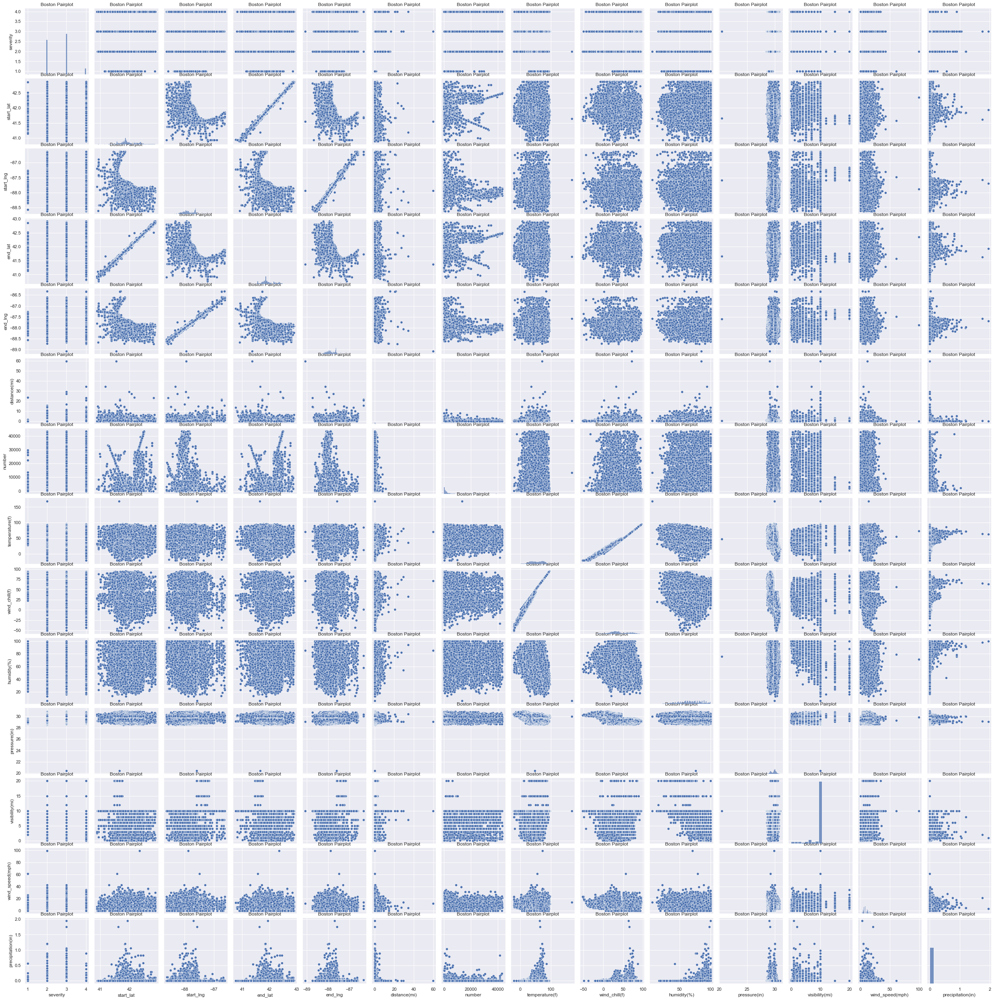

In [39]:
#pairplot for Chicago
sns.pairplot(chi_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']]).set(title = 'Boston Pairplot');

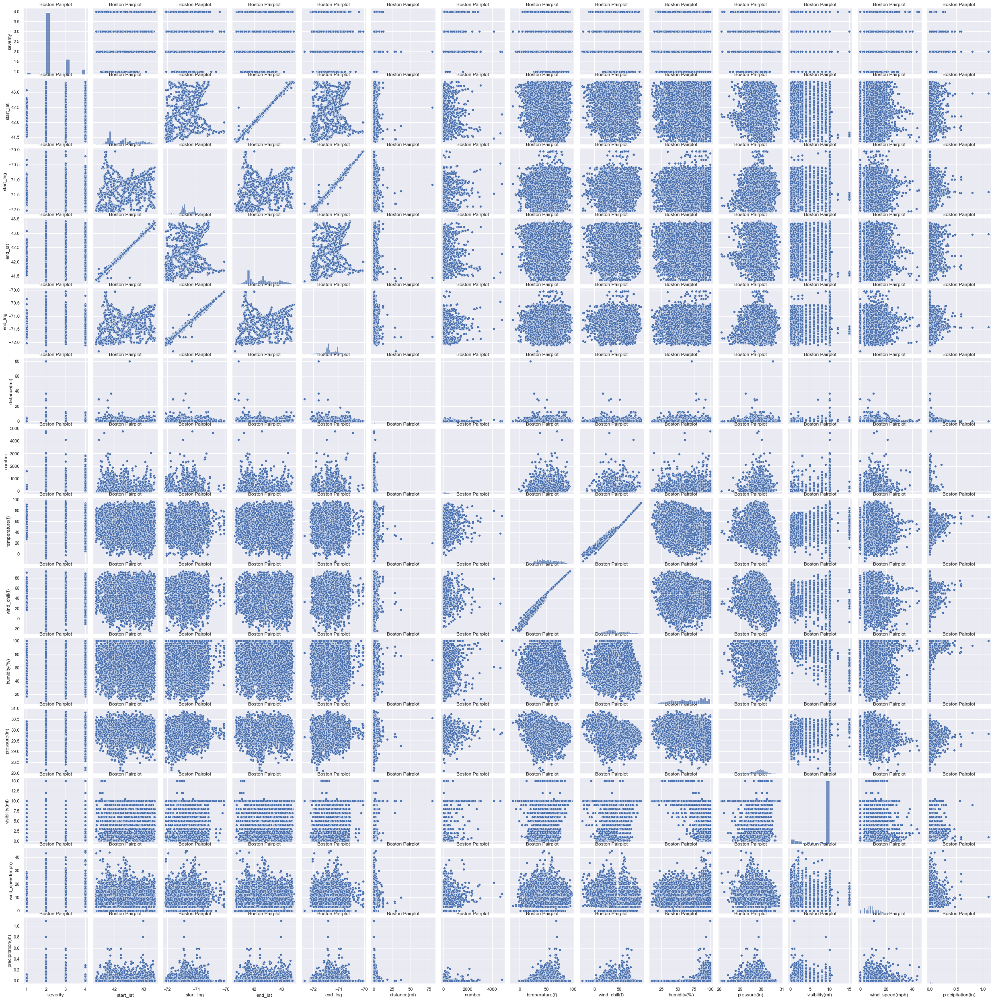

In [46]:
#pairplot for Boston
sns.pairplot(bos_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']]).set(title = 'Boston Pairplot');

#can't set color in pairplot?

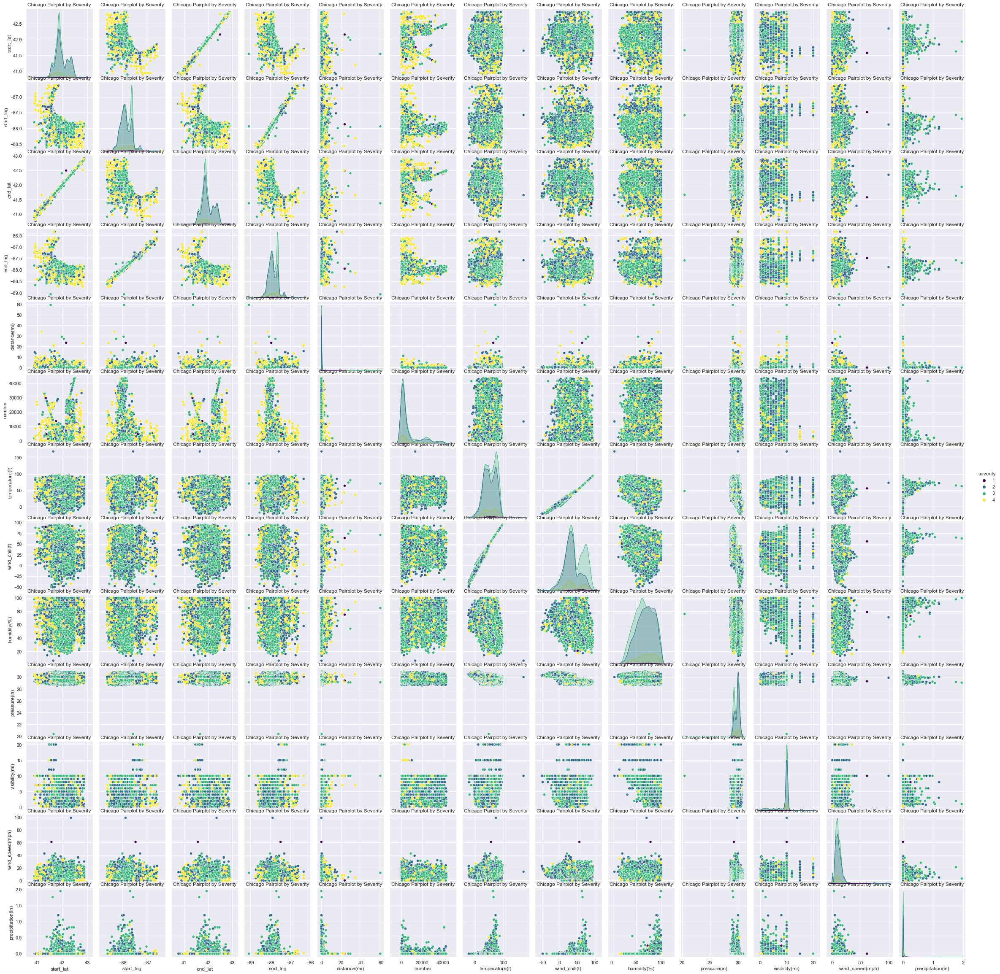

In [18]:
#pairplot for Chicago, hued by Severity
sns.pairplot(chi_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']], hue = 'severity', palette = 'viridis').set(title= 'Chicago Pairplot by Severity');

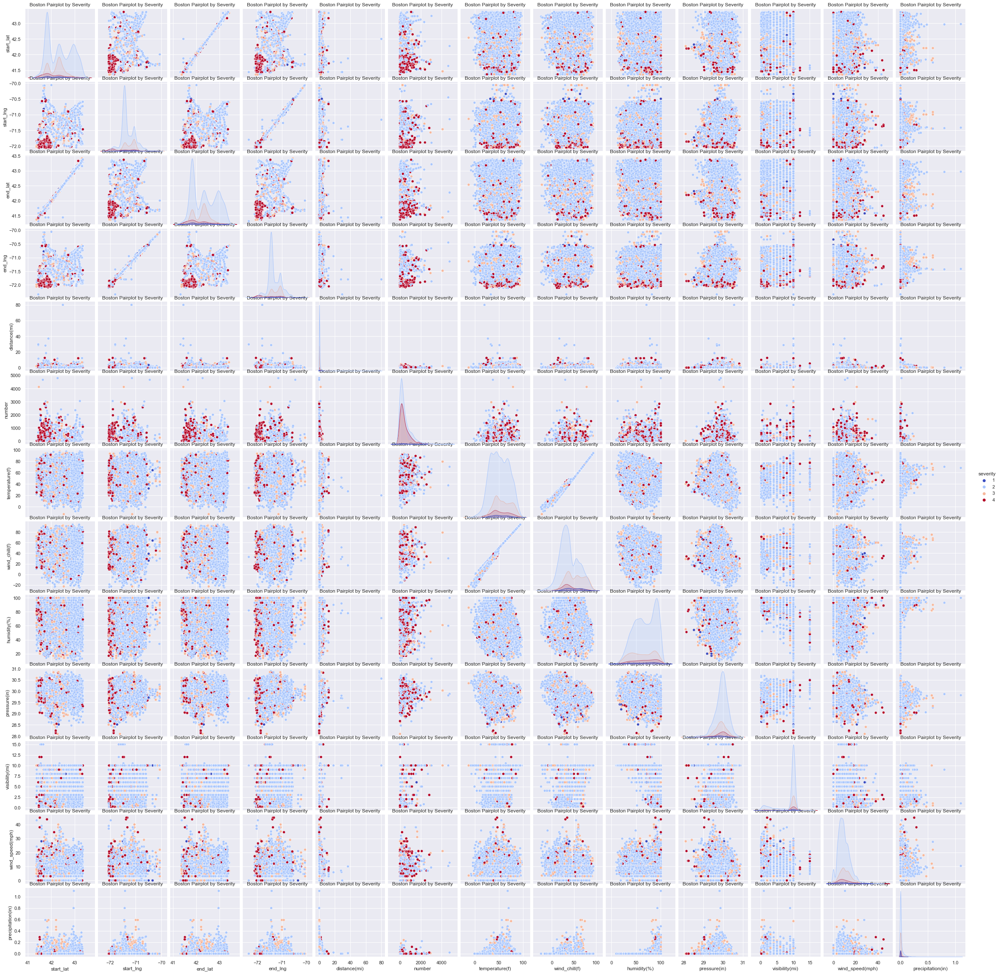

In [98]:
#pairplot for Boston, hued by Severity
sns.pairplot(bos_df_og[['severity', 'start_time', 'end_time', 'start_lat', 'start_lng',
       'end_lat', 'end_lng', 'distance(mi)', 'number', 'weather_timestamp',
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)']], hue = 'severity', palette = 'coolwarm').set(title= 'Boston Pairplot by Severity');

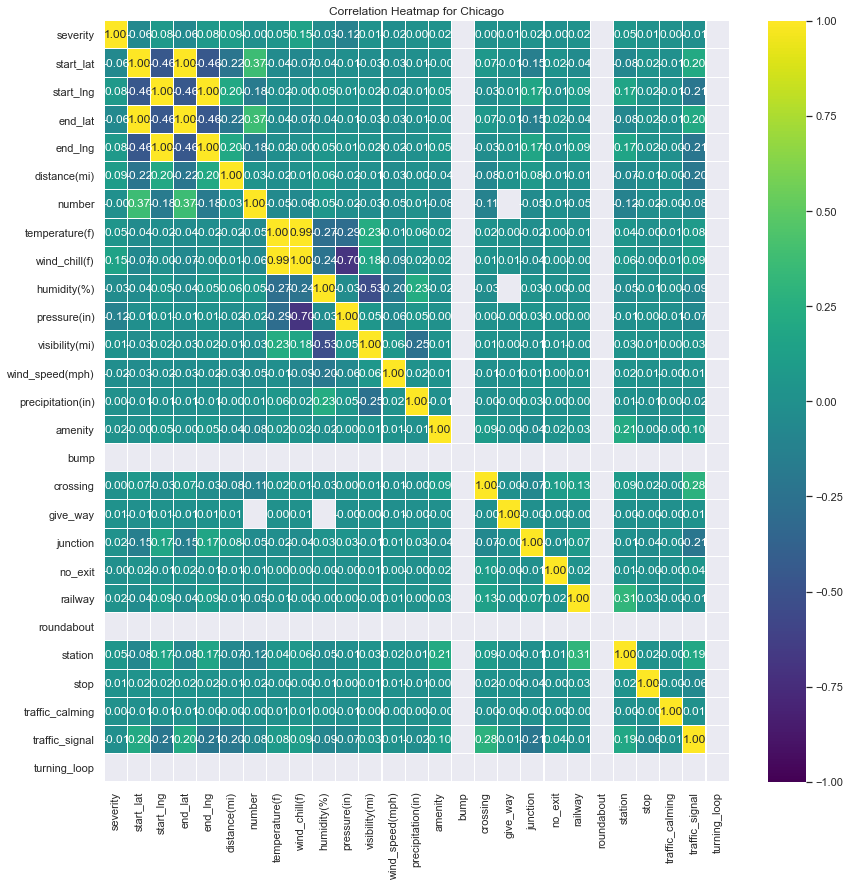

In [20]:
#corr heatmap for Chicago
plt.figure(figsize = (14, 14))
sns.heatmap(chi_df_og.corr(),
            annot = True,
            fmt = '.2f',
            linewidth = .1,
            vmin = -1,
            vmax = 1,
            cmap = 'viridis')
plt.title('Correlation Heatmap for Chicago');

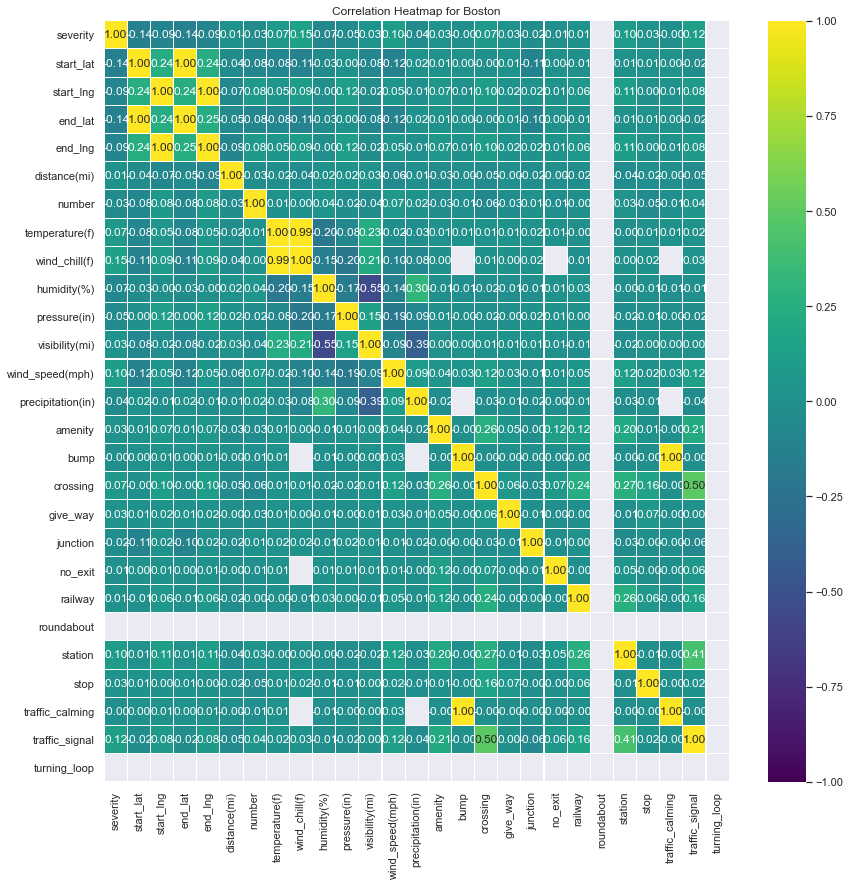

In [21]:
#corr heatmap for Boston
plt.figure(figsize = (14, 14))
sns.heatmap(bos_df_og.corr(),
            annot = True,
            fmt = '.2f',
            linewidth = .1,
            vmin = -1,
            vmax = 1,
            cmap = 'viridis')
plt.title('Correlation Heatmap for Boston');

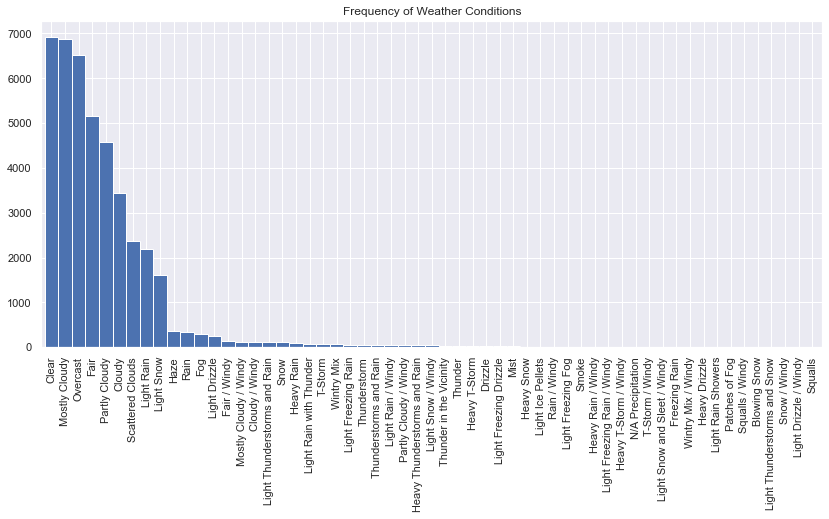

In [94]:
#bar plot of weather conditions for Chicago
chi_df_og['weather_condition'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   title = 'Frequency of Weather Conditions');

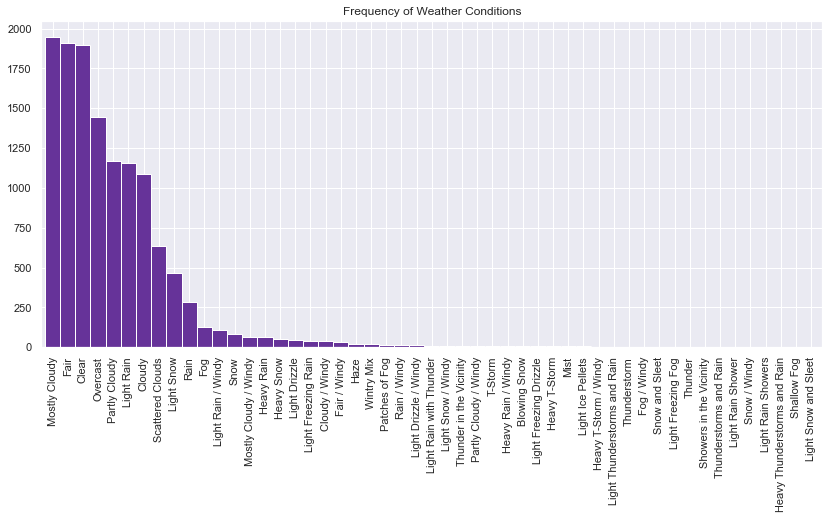

In [95]:
#bar plot of weather conditions for Boston
bos_df_og['weather_condition'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   color = 'rebeccapurple',
                                                   title = 'Frequency of Weather Conditions');

In [11]:
chi_df_og['wind_direction'].replace({
        'North': 'N',
        'South': 'S',
        'West' : 'W',
        'East' : 'E',
        'Calm' : 'CALM',
        'Variable': 'VAR'
    }, inplace = True)

In [33]:
bos_df_og['wind_direction'].replace({
        'North': 'N',
        'South': 'S',
        'West' : 'W',
        'East' : 'E',
        'Calm' : 'CALM',
        'Variable': 'VAR'
    }, inplace = True)

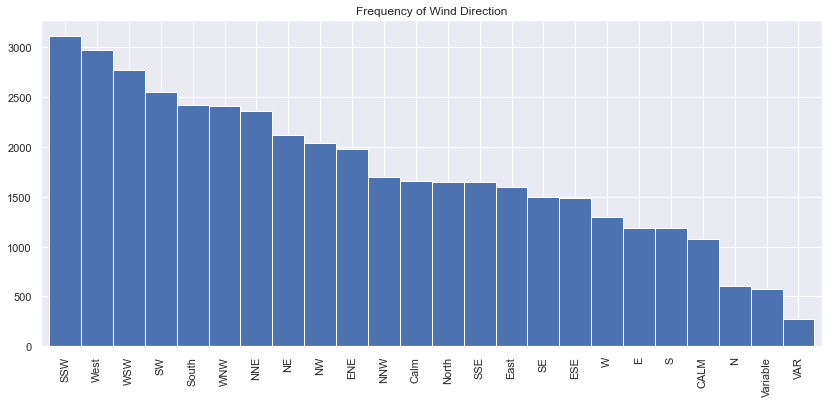

In [96]:
chi_df_og['wind_direction'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   title = 'Frequency of Wind Direction');

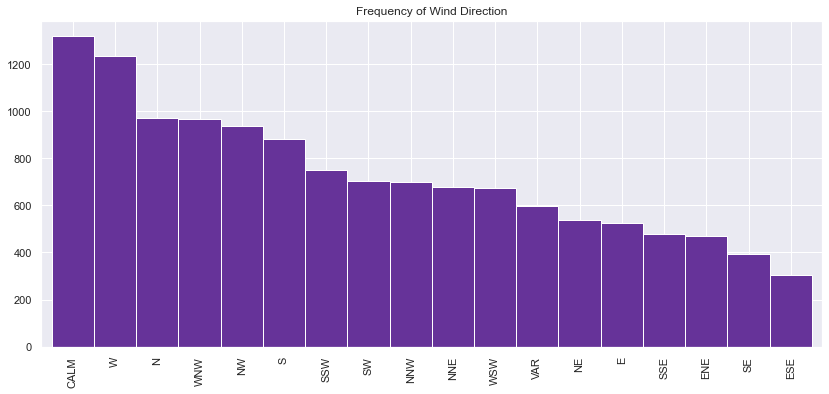

In [97]:
bos_df_og['wind_direction'].value_counts().plot(kind = 'bar',
                                                   figsize=(14, 6),
                                                   width = 1,
                                                   color = 'rebeccapurple',
                                                   title = 'Frequency of Wind Direction');

In [13]:
chi_df_og['start_time'].sort_values()

7196               2016-06-17 14:40:56
7194               2016-06-17 14:42:18
7193               2016-06-17 14:45:04
7195               2016-06-17 14:47:49
7197               2016-06-17 14:47:49
                     ...              
17057              2020-12-31 21:22:00
14861              2020-12-31 21:22:00
16667    2020-12-31 21:22:00.000000000
16371              2020-12-31 22:07:22
16658              2020-12-31 22:07:22
Name: start_time, Length: 42472, dtype: object

In [35]:
bos_df_og['start_time'].sort_values()

1387    2016-03-23 05:33:48
1388    2016-03-23 05:33:48
1389    2016-03-23 07:59:48
1392    2016-03-23 08:01:05
1390    2016-03-23 08:01:05
               ...         
3529    2020-12-31 09:44:00
3988    2020-12-31 20:34:00
3455    2020-12-31 20:34:00
3673    2020-12-31 20:45:00
3944    2020-12-31 20:45:00
Name: start_time, Length: 13283, dtype: object

**Exploring Cleaned Data**

In [14]:
chi_df.shape

(40974, 146)

In [44]:
bos_df.shape

(12178, 140)

In [15]:
#descriptive statistics for Chicago
chi_df[['severity', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep', 
        'start_lat', 'start_lng', 'end_lat', 'end_lng', 'distance(mi)', 
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)', 'accident_duration']].describe().drop('count').T

,mean,std,min,25%,50%,75%,max
severity,2.649192e+00,6.225430e-01,1.000000e+00,2.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00
start_time_ep,1.531392e+09,4.411057e+07,1.466174e+09,1.489386e+09,1.527679e+09,1.575620e+09,1.609452e+09
end_time_ep,1.531407e+09,4.410178e+07,1.466196e+09,1.489407e+09,1.527701e+09,1.575621e+09,1.609458e+09
weather_timestamp_ep,1.531392e+09,4.411055e+07,1.466175e+09,1.489385e+09,1.527679e+09,1.575621e+09,1.609452e+09
start_lat,4.195990e+01,2.682546e-01,4.088821e+01,4.179762e+01,4.189260e+01,4.216155e+01,4.288156e+01
start_lng,-8.786151e+01,2.323141e-01,-8.862312e+01,-8.801885e+01,-8.788053e+01,-8.767468e+01,-8.662489e+01
end_lat,4.195995e+01,2.684129e-01,4.076210e+01,4.179862e+01,4.189229e+01,4.216155e+01,4.291007e+01
end_lng,-8.786134e+01,2.327293e-01,-8.906718e+01,-8.801898e+01,-8.788024e+01,-8.767429e+01,-8.633062e+01
distance(mi),3.509653e-01,8.422718e-01,0.000000e+00,0.000000e+00,1.270000e-01,4.220000e-01,5.946600e+01
temperature(f),5.303954e+01,2.123214e+01,-2.240000e+01,3.650000e+01,5.310000e+01,7.110000e+01,1.688000e+02


In [22]:
#descriptive statistics for Boston
bos_df[['severity', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep', 
        'start_lat', 'start_lng', 'end_lat', 'end_lng', 'distance(mi)', 
       'temperature(f)', 'wind_chill(f)', 'humidity(%)', 'pressure(in)',
       'visibility(mi)', 'wind_speed(mph)', 'precipitation(in)', 'accident_duration']].describe().drop('count').T

,mean,std,min,25%,50%,75%,max
severity,2.287486e+00,6.026489e-01,1.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,4.000000e+00
start_time_ep,1.538616e+09,4.309509e+07,1.458720e+09,1.501060e+09,1.541535e+09,1.584615e+09,1.609448e+09
end_time_ep,1.538627e+09,4.308752e+07,1.458742e+09,1.501082e+09,1.541537e+09,1.584617e+09,1.609457e+09
weather_timestamp_ep,1.538616e+09,4.309514e+07,1.458719e+09,1.501060e+09,1.541536e+09,1.584615e+09,1.609448e+09
start_lat,4.233155e+01,5.070317e-01,4.136190e+01,4.182988e+01,4.232364e+01,4.277420e+01,4.336114e+01
start_lng,-7.132173e+01,2.847564e-01,-7.205621e+01,-7.147456e+01,-7.139437e+01,-7.110840e+01,-7.006000e+01
end_lat,4.233188e+01,5.073252e-01,4.131951e+01,4.183021e+01,4.232174e+01,4.277435e+01,4.341362e+01
end_lng,-7.132190e+01,2.854095e-01,-7.234417e+01,-7.147414e+01,-7.139444e+01,-7.110698e+01,-7.005199e+01
distance(mi),5.189593e-01,1.259770e+00,0.000000e+00,3.000000e-02,2.680000e-01,5.450000e-01,7.994600e+01
temperature(f),5.241037e+01,1.906724e+01,-1.300000e+01,3.790000e+01,5.200000e+01,6.800000e+01,9.700000e+01


In [17]:
chi_df['severity'].value_counts(normalize = True).sort_index()

1    0.006077
2    0.412481
3    0.507615
4    0.073827
Name: severity, dtype: float64

In [98]:
bos_df['severity'].value_counts(normalize = True).sort_index()

1    0.015109
2    0.746346
3    0.174495
4    0.064050
Name: severity, dtype: float64

Exploring the frequency of accidents:

In [23]:
#function to generate count plots
def make_countplot(dataframe,
                   x, y = None,
                   hue = None,
                   palette = None):
    return sns.countplot(data = dataframe,
                         x = x,
                         hue = hue,
                         palette = palette)

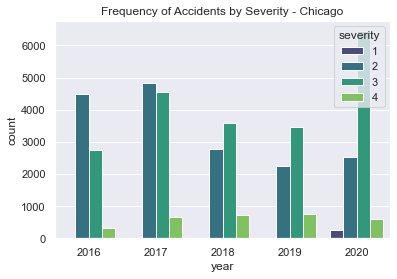

In [25]:
#Frequency of Accidents by Sev. for Chicago
make_countplot(chi_df, x = 'year', hue = 'severity', palette = 'viridis')
plt.title('Frequency of Accidents by Severity - Chicago')
plt.show();

#are '1' severity accidents under reported?
#remember severity is: a number between 1 and 4,
#where 1 indicates the least impact on traffic 
#(i.e., short delay as a result of the accident) and
#4 indicates a significant impact on traffic (i.e., long delay).	

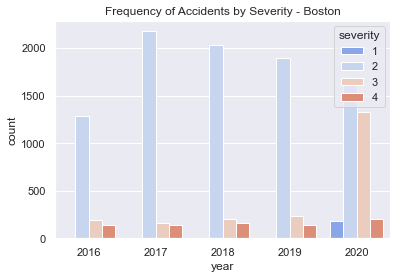

In [96]:
#Frequency of Accidents by Sev. for Boston
make_countplot(bos_df, x = 'year', hue = 'severity', palette = 'coolwarm')
plt.title('Frequency of Accidents by Severity - Boston')
plt.show();

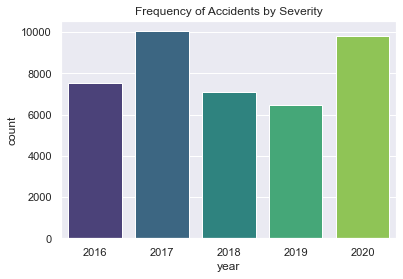

In [77]:
make_countplot(chi_df, 'year', palette = 'viridis')

<AxesSubplot:xlabel='year', ylabel='count'>

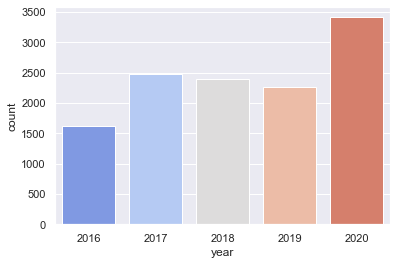

In [97]:
make_countplot(bos_df, 'year', palette = 'coolwarm')

In [119]:
#function to generate histplots
def make_histplot(dataframe, x, y = None, color = None, kde = True):
    sns.histplot(data = dataframe, x = x, y = y, color = color, kde = kde)
    plt.title('Frequency of Accidents by Week')
    return plt.show()

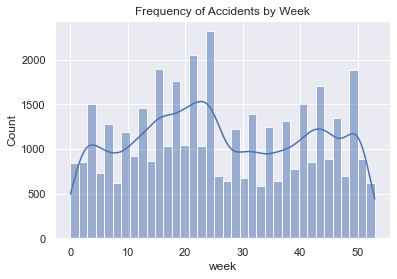

In [114]:
make_histplot(chi_df, x = 'week')
#could the drop around weeks 27, 28 be attributed to the 4th of July holiday?

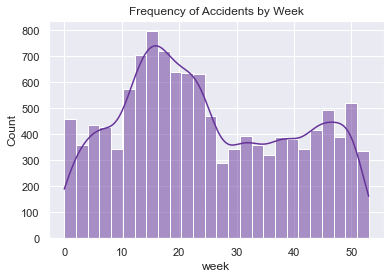

In [103]:
make_histplot(bos_df, x = 'week', color = 'rebeccapurple')

In [193]:
#function to generate kdeplots
def make_kdeplot(dataframe,
                 shade = True,
                 color = None):
    
    return sns.kdeplot(data = dataframe,
                shade = shade,
                color = color);

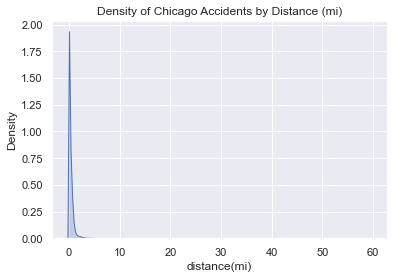

In [194]:
#kde plot for Chicago's distance
make_kdeplot(chi_df['distance(mi)'])
plt.title('Density of Chicago Accidents by Distance (mi)')
plt.show()

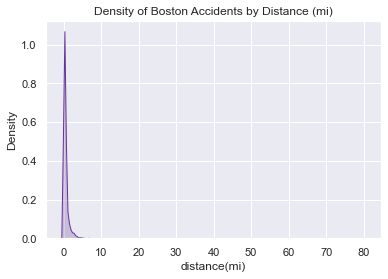

In [195]:
#kde plot for Boston's distance
make_kdeplot(bos_df['distance(mi)'], color = 'rebeccapurple')
plt.title('Density of Boston Accidents by Distance (mi)')
plt.show()

In [189]:
chi_df['distance(mi)'].min()

0.0

In [190]:
bos_df['distance(mi)'].min()

0.0

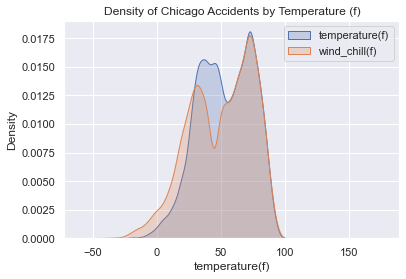

In [191]:
#Looking at weather variables for Chicago

#https://www.python-graph-gallery.com/74-density-plot-of-several-variables
fig = make_kdeplot(chi_df['temperature(f)'], shade = True)
fig = make_kdeplot(chi_df['wind_chill(f)'], shade = True)
plt.title('Density of Chicago Accidents by Temperature (f)')
plt.legend(labels = ['temperature(f)', 'wind_chill(f)'])
plt.show()

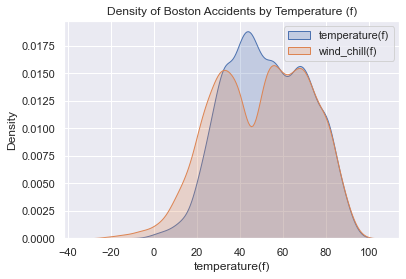

In [199]:
#Looking at weather variables for Boston

#https://www.python-graph-gallery.com/74-density-plot-of-several-variables
fig = make_kdeplot(bos_df['temperature(f)'], shade = True)
fig = make_kdeplot(bos_df['wind_chill(f)'], shade = True)
plt.title('Density of Boston Accidents by Temperature (f)')
plt.legend(labels = ['temperature(f)', 'wind_chill(f)'])
plt.show()

In [25]:
#DELETE DELETE DELETE

#for ease of reference:
chi_df.columns[:40]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'year', 'month',
       'week', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep',
       'accident_duration', 'side_L', 'side_R', 'wind_direction_CALM',
       'wind_direction_E', 'wind_direction_ENE', 'wind_direction_ESE',
       'wind_direction_N'],
      dtype='object')

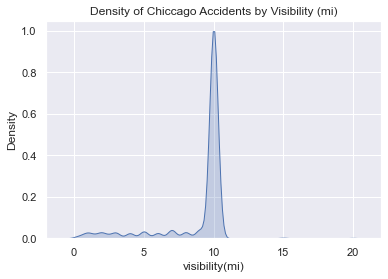

In [207]:
#kde plot for Chicago's visbility distance
make_kdeplot(chi_df['visibility(mi)'])
plt.title('Density of Chiccago Accidents by Visibility (mi)')
plt.show()

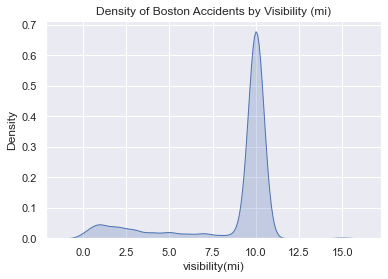

In [208]:
#kde plot for Boston's visbility distance
make_kdeplot(bos_df['visibility(mi)'])
plt.title('Density of Boston Accidents by Visibility (mi)')
plt.show()

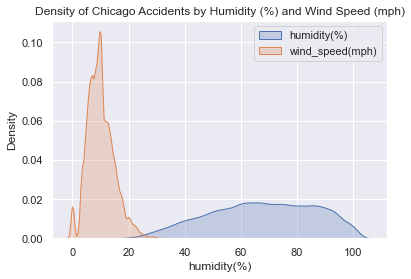

In [214]:
#combined kde plots for Chicago's humidity(%), and wind_speed(mph)
fig = make_kdeplot(chi_df['humidity(%)'])
fig = make_kdeplot(chi_df['wind_speed(mph)'])
plt.title('Density of Chicago Accidents by Humidity (%) and Wind Speed (mph)')
plt.legend(labels = ['humidity(%)', 'wind_speed(mph)'])
plt.show()

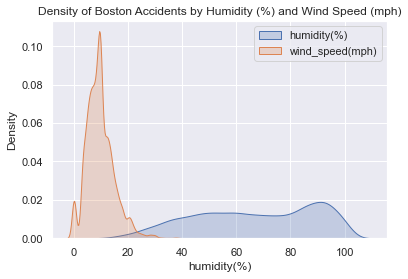

In [213]:
#combined kde plots for Boston's humidity(%), and wind_speed(mph)
fig = make_kdeplot(bos_df['humidity(%)'])
fig = make_kdeplot(bos_df['wind_speed(mph)'])
plt.title('Density of Boston Accidents by Humidity (%) and Wind Speed (mph)')
plt.legend(labels = ['humidity(%)', 'wind_speed(mph)'])
plt.show()

**Trying to Plot the 'Shape' of the Cities**

In [29]:
#https://matplotlib.org/3.3.0/gallery/text_labels_and_annotations/titles_demo.html

#function to generate jointplots
def make_jointplot(x, y,
                   kind = 'kde',
                   fill = True, 
                   color = None):
    
    return sns.jointplot(x = x, y = y,
                         kind = kind,
                         fill = fill,
                         color = color)

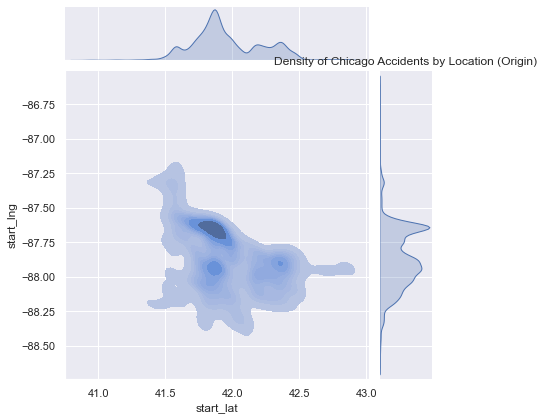

In [40]:
#Density of Chicago's accidents
make_jointplot(x = chi_df["start_lat"], y=chi_df["start_lng"], kind='kde', fill = True)
plt.title('Density of Chicago Accidents by Location (Origin)')
plt.show()

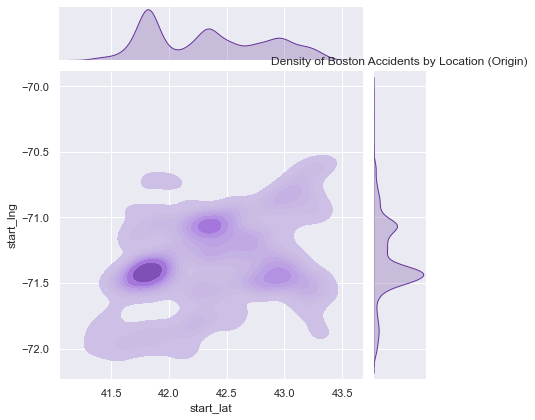

In [41]:
#Density of Bostons's accidents
make_jointplot(x = bos_df["start_lat"], y=bos_df["start_lng"], kind='kde', fill = True, color = 'rebeccapurple')
plt.title('Density of Boston Accidents by Location (Origin)')
plt.show()

In [31]:
#function to generate jointplots - hex kind
def make_jointplothex(x, y,
                   kind = 'hex',
                   color = None):
    
    return sns.jointplot(x = x, y = y,
                         kind = kind,
                         color = color)

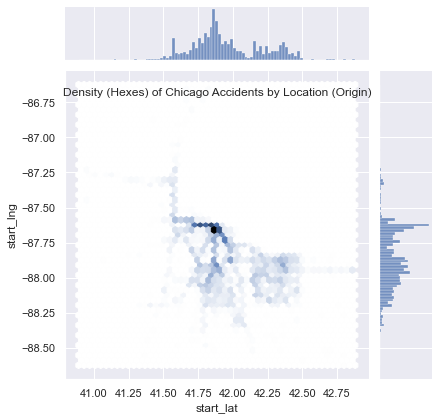

In [36]:
#Density of Chicago's accidents - hexes
make_jointplothex(x = chi_df["start_lat"],
                  y = chi_df["start_lng"],
                  kind = 'hex')
plt.title('Density (Hexes) of Chicago Accidents by Location (Origin)', 
          y = 0.9)
plt.show();

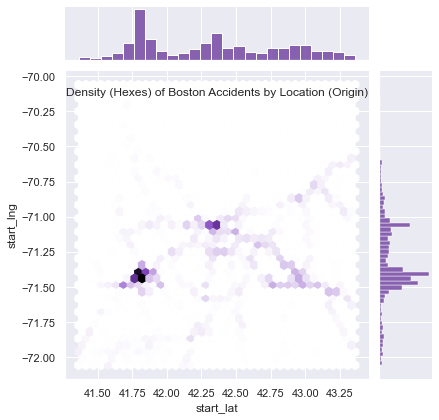

In [40]:
#Density of Boston's accidents - hexes
make_jointplothex(x = bos_df["start_lat"],
                  y = bos_df["start_lng"],
                  kind = 'hex',
                  color = 'rebeccapurple')
plt.title('Density (Hexes) of Boston Accidents by Location (Origin)',
          y = 0.90)
plt.show();

In [83]:
#function to generate scatterplots
def make_scatterplot(x, y, s, alpha):
    #setting figure size
    plt.figure(figsize=(10, 10))
    
    #setting x and y labels
    plt.xlabel('Starting Latitude')
    plt.ylabel('Starting Longitude')
    
    #making plot
    return plt.scatter(x = x,
                       y = y,
                       s = s,
                       alpha = 0.5)

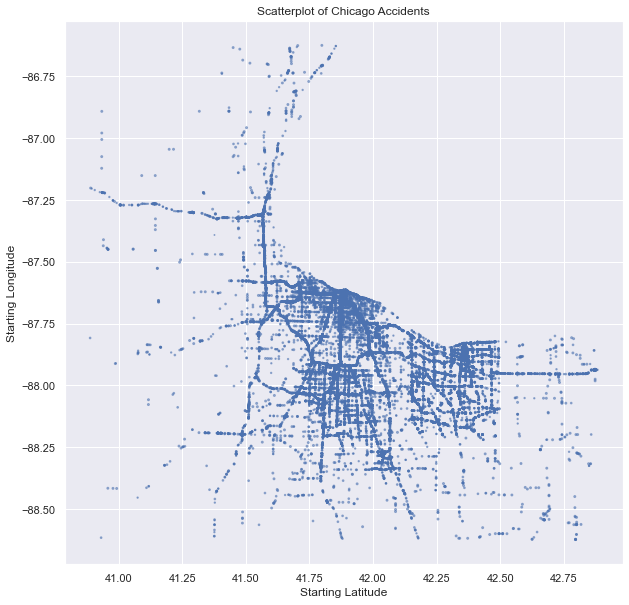

In [78]:
#scatterplot of Chicago
make_scatterplot(x = chi_df['start_lat'],
                 y = chi_df['start_lng'],
                 s = chi_df['severity'],
                 alpha = 0.5)
plt.title('Scatterplot of Chicago Accidents');

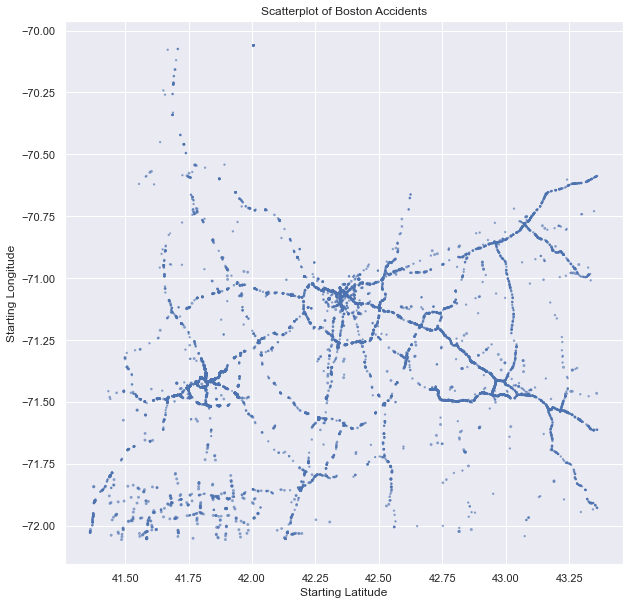

In [79]:
#scatterplot of Boston
make_scatterplot(x = bos_df['start_lat'],
                 y = bos_df['start_lng'],
                 s = bos_df['severity'],
                 alpha = 0.5)
plt.title('Scatterplot of Boston Accidents');

In [87]:
#function to generate hued scatterplots
def make_hued_scatterplot(x, y, c, cmap, alpha):
    #setting figure size:
    plt.figure(figsize=(10, 10))
    
    #setting x and y labels:
    plt.xlabel('Starting Latitude')
    plt.ylabel('Starting Longitude')
    
    #making plot:
    scatter = plt.scatter(x = x,
                          y = y,
                          c = c,
                          cmap = cmap,
                          alpha = 0.5)
    
    #setting legend:
    plt.legend(handles = scatter.legend_elements()[0], labels = [1, 2, 3, 4])
    
    #making plot
    return scatter

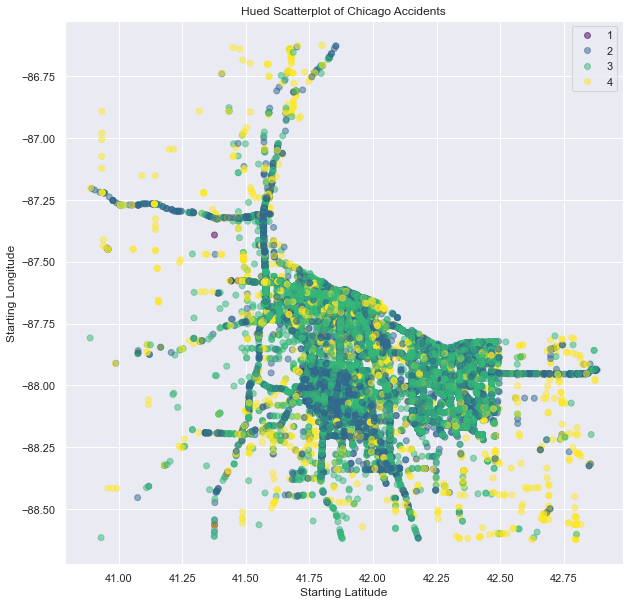

In [90]:
make_hued_scatterplot(x = chi_df['start_lat'],
                      y = chi_df['start_lng'],
                      c = chi_df['severity'],
                      cmap = 'viridis',
                      alpha = 0.5)
plt.title('Hued Scatterplot of Chicago Accidents');

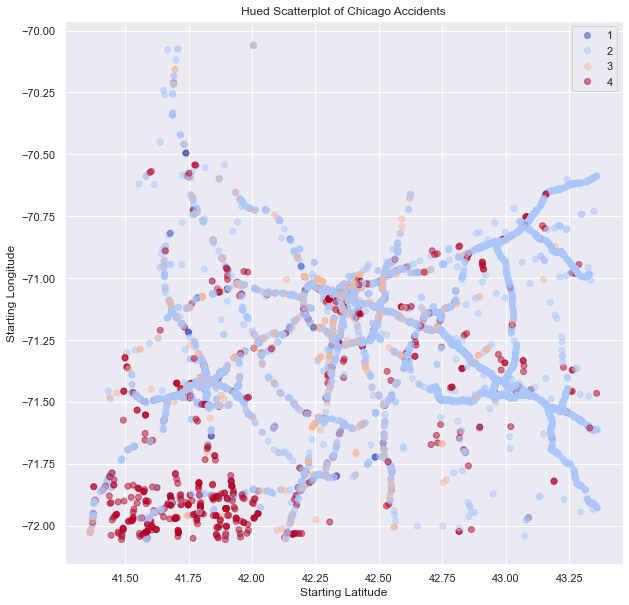

In [95]:
make_hued_scatterplot(x = bos_df["start_lat"],
                      y = bos_df["start_lng"],
                      c = bos_df['severity'],
                      cmap = 'coolwarm',
                      alpha = 0.5)
plt.title('Hued Scatterplot of Chicago Accidents');

**Exploring Time Intervals**

- For Frame of Reference

| Human-readable Time |      Seconds      |
|----------|:-------------:|
| 1 hour | 3600 seconds |
| 1 day | 86400 seconds |
| 1 week | 604800 seconds |
| 1 month (30.44 days) | 2629743 seconds |
| 1 hour (365.24 days) | 31556926 seconds |

source: https://www.epochconverter.com/

In [92]:
chi_df['start_time_ep'] = pd.to_datetime(chi_df['start_time_ep'], unit = 's')
chi_df.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2,42.305960,-87.960150,42.306916,-87.960918,0.077,37.0,31.0,79.0,29.59,10.0,8.1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,2016-11-30 14:46:48,1.480539e+09,1.480518e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2,42.175870,-88.135770,42.174620,-88.135794,0.086,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,2016-11-30 14:58:59,1.480540e+09,1.480518e+09,21600.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,3,42.175897,-88.135769,42.174612,-88.135794,0.089,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,2016-11-30 15:14:24,1.480541e+09,1.480518e+09,22524.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,

In [37]:
chi_df['start_time_ep'].min()

#rslt_df = dataframe[(dataframe['Age'] == 21) &
#          dataframe['Stream'].isin(options)]

Timestamp('2016-06-17 14:40:56')

In [38]:
#https://stackoverflow.com/questions/12400256/converting-epoch-time-into-the-datetime
import time

time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1466174456.0))

'2016-06-17 10:40:56'

In [93]:
chi_df_time_convert = pd.to_datetime(chi_df['start_time_ep'], unit = 's')
chi_df_time_convert = pd.DataFrame(chi_df_time_convert)
chi_df_time_convert.head(3)

,start_time_ep
0,2016-11-30 14:46:48
1,2016-11-30 14:58:59
2,2016-11-30 15:14:24


In [40]:
chi_df_time_convert.rename(columns = {'start_time_ep': 'start_time'}, inplace = True)
chi_df_time_convert.head()

,start_time
0,2016-11-30 14:46:48
1,2016-11-30 14:58:59
2,2016-11-30 15:14:24
3,2016-11-30 16:13:53
4,2016-11-30 16:33:05


In [41]:
chi_df_time_convert = chi_df_time_convert.sort_values('start_time')
chi_df_time_convert.head()

,start_time
7047,2016-06-17 14:40:56
7045,2016-06-17 14:42:18
7044,2016-06-17 14:45:04
7046,2016-06-17 14:47:49
7048,2016-06-17 14:47:49


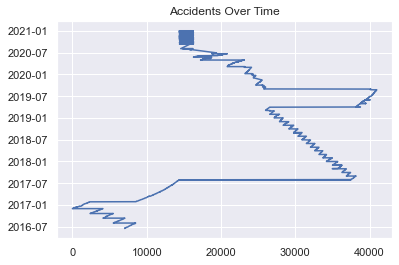

In [42]:
#https://www.python-graph-gallery.com/242-area-chart-and-faceting
plt.plot(chi_df_time_convert)
plt.title("Accidents Over Time");

In [46]:
chi_df.columns[0:50]

Index(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'distance(mi)', 'temperature(f)', 'wind_chill(f)', 'humidity(%)',
       'pressure(in)', 'visibility(mi)', 'wind_speed(mph)',
       'precipitation(in)', 'amenity', 'bump', 'crossing', 'give_way',
       'junction', 'no_exit', 'railway', 'roundabout', 'station', 'stop',
       'traffic_calming', 'traffic_signal', 'turning_loop', 'year', 'month',
       'week', 'start_time_ep', 'end_time_ep', 'weather_timestamp_ep',
       'accident_duration', 'side_L', 'side_R', 'wind_direction_CALM',
       'wind_direction_E', 'wind_direction_ENE', 'wind_direction_ESE',
       'wind_direction_N', 'wind_direction_NE', 'wind_direction_NNE',
       'wind_direction_NNW', 'wind_direction_NW', 'wind_direction_S',
       'wind_direction_SE', 'wind_direction_SSE', 'wind_direction_SSW',
       'wind_direction_SW', 'wind_direction_VAR'],
      dtype='object')

In [47]:
#trying to pinpoint the 'average' accident severity and location:
mean_accident_loc = chi_df[['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng']].mean()
loc_dict = dict(mean_accident_loc)
loc_dict

{'severity': 2.649192170644799,
 'start_lat': 41.95989841897385,
 'start_lng': -87.86150936083946,
 'end_lat': 41.95995016124734,
 'end_lng': -87.86133772533927}

In [48]:
print(loc_dict.keys())
print(loc_dict.values())

dict_keys(['severity', 'start_lat', 'start_lng', 'end_lat', 'end_lng'])
dict_values([2.649192170644799, 41.95989841897385, -87.86150936083946, 41.95995016124734, -87.86133772533927])


**Looking At Individual Years, Months, and Days of DST**

In [48]:
chi_2016 = chi_df.loc[chi_df['year'] == 2016]
chi_2017 = chi_df.loc[chi_df['year'] == 2017]
chi_2018 = chi_df.loc[chi_df['year'] == 2018]
chi_2019 = chi_df.loc[chi_df['year'] == 2019]
chi_2020 = chi_df.loc[chi_df['year'] == 2020]

In [49]:
print(chi_2016.shape[0])
print(chi_2017.shape[0])
print(chi_2018.shape[0])
print(chi_2019.shape[0])
print(chi_2020.shape[0])

7551
10037
7088
6483
9815


In [50]:
chi_2016.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2,42.305960,-87.960150,42.306916,-87.960918,0.077,37.0,31.0,79.0,29.59,10.0,8.1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480517e+09,1.480539e+09,1.480518e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2,42.175870,-88.135770,42.174620,-88.135794,0.086,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480518e+09,1.480540e+09,1.480518e+09,21600.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,3,42.175897,-88.135769,42.174612,-88.135794,0.089,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480519e+09,1.480541e+09,1.480518e+09,22524.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [51]:
#NEED TO LOOK AT #NEED TO LOOK AT #NEED TO LOOK AT 
#NEED TO LOOK AT #NEED TO LOOK AT #NEED TO LOOK AT 
#NEED TO LOOK AT #NEED TO LOOK AT #NEED TO LOOK AT 

#https://stackoverflow.com/questions/39135472/setting-order-of-columns-with-matplotlib-bar-chart

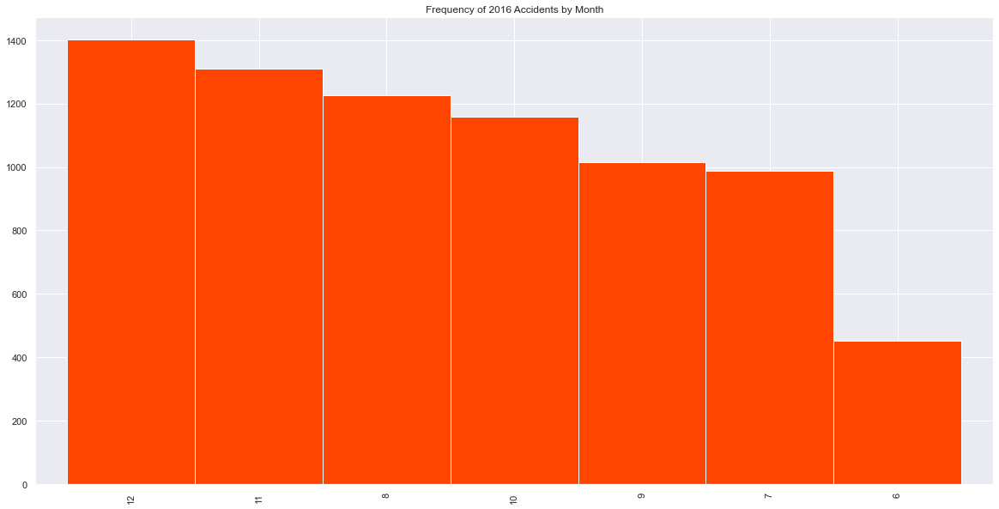

In [52]:
chi_2016['month'].value_counts().plot(kind = 'bar',
                                                   figsize=(20, 10),
                                                   width = 1,
                                                   color = 'orangered',
                                                   title = 'Frequency of 2016 Accidents by Month');

In [53]:
chi_2017.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
1413,3,41.871010,-87.76894,41.874150,-87.80818,2.030,25.0,19.3,78.0,30.07,10.0,4.6,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,1,1,1.483238e+09,1.483259e+09,1.483239e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1414,3,41.753837,-87.94486,41.753401,-87.94485,0.030,39.0,32.8,89.0,29.96,1.5,9.2,0.01,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,1,1,1.483374e+09,1.483396e+09,1.483374e+09,21600.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1415,3,41.753345,-87.94458,41.753832,-87.94459,0.034,39.0,32.8,89.0,29.96,1.5,9.2,0.01,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,1,1,1.483374e+09,1.483396e+09,1.483374e+09,21600.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

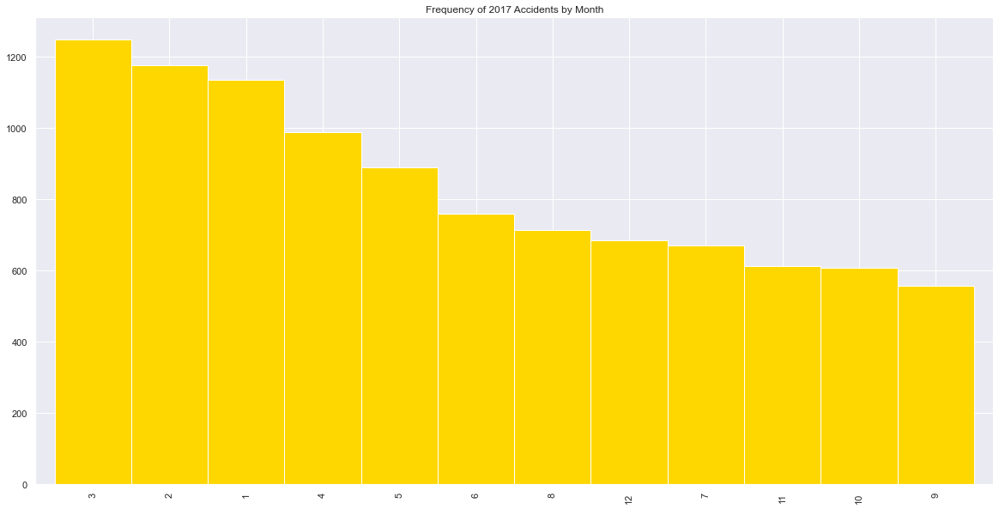

In [54]:
chi_2017['month'].value_counts().plot(kind = 'bar',
                                                   figsize=(20, 10),
                                                   width = 1,
                                                   color = 'gold',
                                                   title = 'Frequency of 2017 Accidents by Month');

In [55]:
chi_2018.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
27875,3,41.57114,-87.43828,41.56983,-87.41798,1.053,41.0,39.0,81.0,30.05,4.0,3.5,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,11,47,1.543594e+09,1.543596e+09,1.543593e+09,1784.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
27876,2,41.93763,-88.03780,41.92605,-88.03793,0.800,28.9,22.8,85.0,29.97,6.0,5.8,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2018,11,47,1.543557e+09,1.543558e+09,1.543557e+09,1773.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
27877,2,41.94658,-87.71148,41.94658,-87.71148,0.000,28.9,25.2,82.0,30.01,7.0,3.5,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,11,47,1.543563e+09,1.543565e+09,1.543564e+09,1761.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

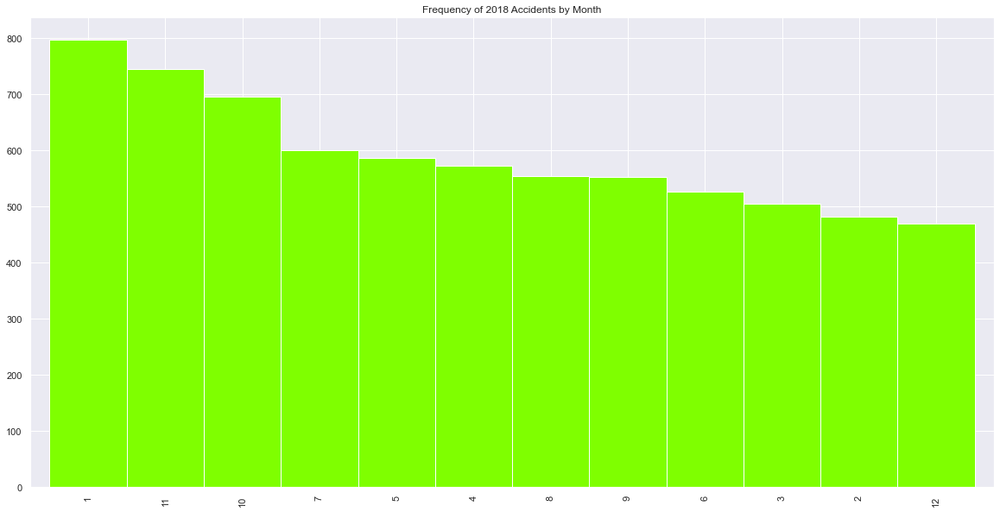

In [56]:
chi_2018['month'].value_counts().plot(kind = 'bar',
                                                   figsize=(20, 10),
                                                   width = 1,
                                                   color = 'chartreuse',
                                                   title = 'Frequency of 2018 Accidents by Month');

In [57]:
chi_2019.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
24110,3,41.87248,-87.64574,41.87036,-87.64508,0.150,27.0,19.0,81.0,29.15,10.0,8.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019,12,52,1.577837e+09,1.577838e+09,1.577836e+09,1726.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
24111,3,41.87561,-87.64155,41.87571,-87.64355,0.103,27.0,19.0,81.0,29.15,10.0,8.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2019,12,52,1.577837e+09,1.577838e+09,1.577836e+09,1726.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
24112,3,41.90150,-87.92034,41.90963,-87.93019,0.756,25.0,16.0,85.0,29.08,10.0,8.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2019,12,52,1.577837e+09,1.577838e+09,1.577836e+09,1726.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,

In [58]:
chi_2020.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
14392,2,42.207312,-87.811845,42.208289,-87.812422,0.074,40.0,34.0,41.0,29.57,10.0,8.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020,12,48,1.606935e+09,1.606941e+09,1.606935e+09,6032.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
14393,2,42.363555,-87.929838,42.363601,-87.929777,0.004,31.0,24.0,69.0,29.08,10.0,7.0,0.0,0,0,1,0,0,0,0,0,0,0,0,1,0,2020,12,52,1.609338e+09,1.609344e+09,1.609336e+09,6006.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
14394,2,42.170064,-88.020662,42.170132,-88.018971,0.087,32.0,27.0,59.0,29.48,10.0,5.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020,12,48,1.606963e+09,1.606969e+09,1.606964e+09,6250.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

In [59]:
#the earliest available dates are in June 2016

chi_2016_11 = chi_2016.loc[chi_2016['month'] == 11]
chi_2016_11.head(3)

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
0,2,42.305960,-87.960150,42.306916,-87.960918,0.077,37.0,31.0,79.0,29.59,10.0,8.1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480517e+09,1.480539e+09,1.480518e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2,42.175870,-88.135770,42.174620,-88.135794,0.086,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480518e+09,1.480540e+09,1.480518e+09,21600.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,3,42.175897,-88.135769,42.174612,-88.135794,0.089,37.0,28.1,76.0,29.62,10.0,15.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,2016,11,48,1.480519e+09,1.480541e+09,1.480518e+09,22524.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [60]:
chi_2017_03 = chi_2017.loc[chi_2017['month'] == 3]
#chi_2017_03.head(3)

chi_2017_11 = chi_2017.loc[chi_2017['month'] == 11]
#chi_2017_11.head(3)

In [61]:
chi_2018_03 = chi_2018.loc[chi_2018['month'] == 3]
#chi_2018_03.head(3)

chi_2018_11 = chi_2018.loc[chi_2018['month'] == 11]
#chi_2018_11.head(3)

In [62]:
chi_2019_03 = chi_2019.loc[chi_2019['month'] == 3]
#chi_2019_03.head(3)

chi_2019_11 = chi_2019.loc[chi_2019['month'] == 11]
#chi_2019_11.head(3)

In [63]:
chi_2020_03 = chi_2020.loc[chi_2020['month'] == 3]
#chi_2020_03.head(3)

chi_2020_11 = chi_2020.loc[chi_2020['month'] == 11]
#chi_2020_11.head(3)

In [35]:
#ease of reference:
#| 2016 | March 13 | November 6 |
    #March 13 starts 1457827200
    #March 13 ends 1457913599
    #November 6 starts 1478390400
    #November 6 ends 1478476799


#| 2017 | March 12 | November 5 |
    #March 12 starts 1489276800
    #March 12 end 1489363199
    #November 5 starts 1509840000
    #November 5 end 1509926399


#| 2018 | March 11 | November 4 |
    #March 11 starts 1520726400
    #March 11 end 1520812799
    #November 4 starts 1541289600
    #November 4 end 1541375999


#| 2019 | March 10 | November 3 |
    #March 10 starts 1552176000
    #March 10 end 1552262399
    #November 3 starts 1572739200
    #November 3 end 1572825599


#| 2020 | March 8 | November 2 |
    #March 8 starts 1583625600
    #March 8 end 1583711999
    #November 2 starts 1604275200
    #November 2 end 1604361599

In [64]:
#| 2016 | March 13 | November 6 |
    #March 13 starts 1457827200
    #March 13 ends 1457913599
    #November 6 starts 1478390400
    #November 6 ends 1478476799

In [65]:
#https://stackoverflow.com/questions/31617845/how-to-select-rows-in-a-dataframe-between-two-values-in-python-pandas/40442778

chi_2016_11_DST = chi_2016_11[chi_2016_11['start_time_ep'].between(1478390400, 1478476799)]
chi_2016_11_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
3065,2,41.72170,-87.62416,41.74064,-87.62468,1.309,52.0,52.0,80.0,30.32,10.0,4.600000,0.0,0,0,0,0,0,0,1,0,1,0,0,1,0,2016,11,45,1.478397e+09,1.478415e+09,1.478397e+09,18000.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3066,2,41.85757,-87.64439,41.84596,-87.63746,0.878,50.0,50.0,80.0,30.35,10.0,3.500000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2016,11,45,1.478408e+09,1.478429e+09,1.478408e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3067,2,41.89765,-87.65921,41.89244,-87.65262,0.494,48.0,48.0,83.0,30.35,10.0,3.500000,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2016,11,45,1.478411e+09,1.478432e+09,1.478412e+09,21600.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

In [66]:
#| 2017 | March 12 | November 5 |
    #March 12 starts 1489276800
    #March 12 end 1489363199
    #November 5 starts 1509840000
    #November 5 end 1509926399

In [67]:
chi_2017_03_DST = chi_2017_03[chi_2017_03['start_time_ep'].between(1489276800, 1489363199)]
chi_2017_03_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
10221,2,41.604130,-87.58334,41.597260,-87.58372,0.475,21.7,21.7,49.0,30.44,10.0,10.003125,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2017,3,11,1.489291e+09,1.489312e+09,1.489291e+09,21600.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10222,4,42.029388,-88.06030,42.024888,-88.06037,0.311,21.9,14.5,53.0,30.50,10.0,5.800000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,3,11,1.489310e+09,1.489331e+09,1.489309e+09,21600.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10223,4,42.024888,-88.06037,42.029388,-88.06030,0.311,21.9,14.5,53.0,30.50,10.0,5.800000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,3,11,1.489310e+09,1.489331e+09,1.489309e+09,21600.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

In [68]:
chi_2017_11_DST = chi_2017_11[chi_2017_11['start_time_ep'].between(1509840000, 1509926399)]
chi_2017_11_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
35776,2,41.70957,-87.531210,41.60890,-87.414550,9.20,50.9,50.9,67.0,29.96,10.0,12.700000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,11,45,1.509921e+09,1.509943e+09,1.509921e+09,21600.0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
35777,4,41.52774,-88.085758,41.52771,-88.086926,0.06,49.6,49.6,100.0,29.79,3.0,10.003125,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017,11,45,1.509853e+09,1.509875e+09,1.509853e+09,21600.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [69]:
#| 2018 | March 11 | November 4 |
    #March 11 starts 1520726400
    #March 11 end 1520812799
    #November 4 starts 1541289600
    #November 4 end 1541375999

In [71]:
chi_2018_03_DST = chi_2018_03[chi_2018_03['start_time_ep'].between(1520726400, 1520812799)]
chi_2018_03_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
33382,4,42.625060,-88.62193,42.65553,-88.54135,4.605,20.3,20.3,88.0,30.16,10.0,10.003125,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2018,3,10,1.520740e+09,1.520762e+09,1.520740e+09,21600.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
33383,3,41.756970,-87.88102,41.75395,-87.87284,0.470,39.0,31.8,46.0,30.22,10.0,11.500000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,3,10,1.520778e+09,1.520800e+09,1.520780e+09,21600.0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
33384,4,41.966261,-87.74720,41.96076,-87.74345,0.426,32.0,27.5,61.0,30.20,10.0,4.600000,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,3,10,1.520802e+09,1.520823e+09,1.520801e+09,21600.0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [72]:
chi_2018_11_DST = chi_2018_11[chi_2018_11['start_time_ep'].between(1541289600, 1541375999)]
chi_2018_11_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
28446,2,41.874019,-87.730424,41.874019,-87.730424,0.000,46.9,46.9,74.0,30.18,10.0,17.3,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,2018,11,44,1.541292e+09,1.541294e+09,1.541293e+09,1779.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
28447,2,41.810502,-87.631439,41.799400,-87.631710,0.767,46.9,46.9,80.0,30.13,10.0,16.1,0.01,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,11,44,1.541303e+09,1.541304e+09,1.541304e+09,1783.0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
28448,2,41.711031,-87.798408,41.711031,-87.798408,0.000,48.0,48.0,74.0,30.10,10.0,16.1,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,2018,11,44,1.541308e+09,1.541309e+09,1.541307e+09,1769.0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [73]:
#| 2019 | March 10 | November 3 |
    #March 10 starts 1552176000
    #March 10 end 1552262399
    #November 3 starts 1572739200
    #November 3 end 1572825599

In [75]:
chi_2019_03_DST = chi_2019_03[chi_2019_03['start_time_ep'].between(1552176000, 1552262399)]
chi_2019_03_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
26129,3,41.874480,-87.704350,41.874960,-87.701050,0.173,37.9,27.3,68.0,30.10,10.0,21.9,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2019,3,10,1.552237e+09,1.552239e+09,1.552237e+09,1776.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
26130,3,41.956460,-87.736080,41.952160,-87.728340,0.496,34.0,23.4,70.0,30.14,10.0,17.3,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019,3,10,1.552245e+09,1.552247e+09,1.552244e+09,1762.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
26131,4,42.054469,-87.844677,42.054580,-87.840350,0.222,32.0,22.5,61.0,30.21,10.0,12.7,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019,3,10,1.552256e+09,1.552258e+09,1.552255e+09,1760.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,

In [76]:
chi_2019_11_DST = chi_2019_11[chi_2019_11['start_time_ep'].between(1572739200, 1572825599)]
chi_2019_11_DST

,severity,start_lat,start_lng,end_lat,end_lng,distance(mi),temperature(f),wind_chill(f),humidity(%),pressure(in),visibility(mi),wind_speed(mph),precipitation(in),amenity,bump,crossing,give_way,junction,no_exit,railway,roundabout,station,stop,traffic_calming,traffic_signal,turning_loop,year,month,week,start_time_ep,end_time_ep,weather_timestamp_ep,accident_duration,side_L,side_R,wind_direction_CALM,wind_direction_E,wind_direction_ENE,wind_direction_ESE,wind_direction_N,wind_direction_NE,wind_direction_NNE,wind_direction_NNW,wind_direction_NW,wind_direction_S,wind_direction_SE,wind_direction_SSE,wind_direction_SSW,wind_direction_SW,wind_direction_VAR,wind_direction_W,wind_direction_WNW,wind_direction_WSW,weather_condition_Blowing Snow,weather_condition_Clear,weather_condition_Cloudy,weather_condition_Cloudy / Windy,weather_condition_Drizzle,weather_condition_Fair,weather_condition_Fair / Windy,weather_condition_Fog,weather_condition_Freezing Rain,weather_condition_Haze,weather_condition_Heavy Drizzle,weather_condition_Heavy Rain,weather_condition_Heavy Rain / Windy,weather_condition_Heavy Snow,weather_condition_Heavy T-Storm,weather_condition_Heavy T-Storm / Windy,weather_condition_Heavy Thunderstorms and Rain,weather_condition_Light Drizzle,weather_condition_Light Drizzle / Windy,weather_condition_Light Freezing Drizzle,weather_condition_Light Freezing Fog,weather_condition_Light Freezing Rain,weather_condition_Light Freezing Rain / Windy,weather_condition_Light Ice Pellets,weather_condition_Light Rain,weather_condition_Light Rain / Windy,weather_condition_Light Rain with Thunder,weather_condition_Light Snow,weather_condition_Light Snow / Windy,weather_condition_Light Snow and Sleet / Windy,weather_condition_Light Thunderstorms and Rain,weather_condition_Light Thunderstorms and Snow,weather_condition_Mist,weather_condition_Mostly Cloudy,weather_condition_Mostly Cloudy / Windy,weather_condition_N/A Precipitation,weather_condition_Overcast,weather_condition_Partly Cloudy,weather_condition_Partly Cloudy / Windy,weather_condition_Rain,weather_condition_Rain / Windy,weather_condition_Scattered Clouds,weather_condition_Smoke,weather_condition_Snow,weather_condition_Snow / Windy,weather_condition_Squalls,weather_condition_Squalls / Windy,weather_condition_T-Storm / Windy,weather_condition_Thunder,weather_condition_Thunder in the Vicinity,weather_condition_Thunderstorm,weather_condition_Thunderstorms and Rain,weather_condition_Wintry Mix,weather_condition_Wintry Mix / Windy,sunrise_sunset_Day,sunrise_sunset_Night,civil_twilight_Day,civil_twilight_Night,nautical_twilight_Day,nautical_twilight_Night,astronomical_twilight_Day,astronomical_twilight_Night,day_Friday,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday,hour_00,hour_01,hour_02,hour_03,hour_04,hour_05,hour_06,hour_07,hour_08,hour_09,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
25336,3,41.76116,-87.89332,41.76814,-87.90469,0.759,53.0,53.0,43.0,29.31,10.0,16.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,2019,11,44,1.572792e+09,1.572793e+09,1.572793e+09,1672.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [74]:
#| 2020 | March 8 | November 2 |
    #March 8 starts 1583625600
    #March 8 end 1583711999
    #November 2 starts 1604275200
    #November 2 end 1604361599